# Experiment 01: Implementació de la U-NET per a la segmentació de ferides i grapes alhora


Primer de tot, reservarem la primera cel·la de codi per a fer tots els imports necessaris. Després, ja escriurem el codi.

In [1]:
import cv2
import glob
import numpy 
import os
import skimage

import tensorflow as tf
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

from tensorflow.keras import activations
from matplotlib import pyplot as plt
from numpy.random import seed
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras import backend 
from tensorflow.keras.optimizers import *
from typing import Tuple, List

os.environ["CUDA_VISIBLE_DEVICES"] = "1"
seed(1)

2024-07-01 16:07:00.386169: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1


## Lectura del *Redscar Dataset* i implementació del generador

Les imatges que s'empraran per a fer l'entrenament les anirem carregant a mesura que la xarxa les demani, per evitar carregar tot el dataset en memòria. Primer de tot, establirem la ruta del dataset.

In [2]:
REDSCAR_DATASET = "/home/marc/UIB_EXPERIMENTS/REDSCAR"
REDSCAR_ML_DATASET = os.path.join(REDSCAR_DATASET, 'SUBSETS', 'MACHINE_LEARNING_DATASET')
REDSCAR_DATASET_IMAGES = os.path.join(REDSCAR_DATASET, 'REDSCAR_DATASET', 'IMAGES')
REDSCAR_DATASET_MASKS_WOUND = os.path.join(REDSCAR_DATASET, 'REDSCAR_DATASET', 'GT_WOUND_MASK')
REDSCAR_DATASET_MASKS_STAPLE = os.path.join(REDSCAR_DATASET, 'REDSCAR_DATASET', 'GT_STAPLES_MASK')

In [3]:
# # DESCOMENTAR PER FER UNA CÀRREGA DES DE ZERO. ALTERNATIVAMENT, EMPRAR EL DATASET JA CARREGAT DINS MEMÒRIA
# def process_image(image_name: str, path: str, size: Tuple[int, int]) -> numpy.array:
#     img = cv2.imread(os.path.join(path, image_name), 1)
#     img = skimage.transform.resize(img, (size[0], size[1], 3))
#     return img

# def process_gt(image_name: str, path: str, size: Tuple[int, int]) -> numpy.array:
#     mask = cv2.imread(os.path.join(path, image_name), 0)
#     mask = cv2.resize(mask, size)

#     mask = mask/255
#     mask[mask < 0.5] = 0
#     mask[mask >= 0.5] = 1
#     return mask

# with open(os.path.join(REDSCAR_ML_DATASET, "train.txt")) as train_file:
#     TRAIN_IMAGES_NAMES = [line.rstrip() for line in train_file]
    
# with open(os.path.join(REDSCAR_ML_DATASET, "test.txt")) as test_file:
#     TEST_IMAGES_NAMES = [line.rstrip() for line in test_file]

# print("-> Loading original images on train set.")
# IMAGES_TRAIN = [process_image(image_name=image_name, path=REDSCAR_DATASET_IMAGES, size=(256, 256)) for image_name in TRAIN_IMAGES_NAMES]
# print("-> Loading original images on test set.")
# IMAGES_TEST = [process_image(image_name=image_name, path=REDSCAR_DATASET_IMAGES, size=(256, 256)) for image_name in TEST_IMAGES_NAMES]
# print("-> Loading masks for wound segmentation task on train set.")
# GROUND_TRUTHS_WOUND_TRAIN = [process_gt(image_name=image_name, path=REDSCAR_DATASET_MASKS_WOUND, size=(256, 256)) for image_name in TRAIN_IMAGES_NAMES]
# print("-> Loading masks for wound segmentation task on test set.")
# GROUND_TRUTHS_WOUND_TEST = [process_gt(image_name=image_name, path=REDSCAR_DATASET_MASKS_WOUND, size=(256, 256)) for image_name in TEST_IMAGES_NAMES]
# print("-> Loading masks for staples segmentation task on train set.")
# GROUND_TRUTHS_STAPLE_TRAIN = [process_gt(image_name=image_name, path=REDSCAR_DATASET_MASKS_STAPLE, size=(256, 256)) for image_name in TRAIN_IMAGES_NAMES]
# print("-> Loading masks for staples segmentation task on test set.")
# GROUND_TRUTHS_STAPLE_TEST = [process_gt(image_name=image_name, path=REDSCAR_DATASET_MASKS_STAPLE, size=(256, 256)) for image_name in TEST_IMAGES_NAMES]

%store -r IMAGES_TRAIN
%store -r IMAGES_TEST
%store -r GROUND_TRUTHS_WOUND_TRAIN
%store -r GROUND_TRUTHS_WOUND_TEST
%store -r GROUND_TRUTHS_STAPLE_TRAIN
%store -r GROUND_TRUTHS_STAPLE_TEST

In [4]:
def cnn_generator(images: List[numpy.array], 
                  masks_wound: List[numpy.array], 
                  masks_staple: List[numpy.array],
                  batch_size: int):
    assert (len(images)==len(masks_wound)) and (len(images)==len(masks_staple)), "The number of images and masks to be used must match." 
    batch_img = []
    batch_masks = []
    idx = 1
    
    while(True):
        batch_img.append(images[idx % len(images)])
        batch_masks.append(numpy.dstack((masks_wound[idx % len(images)], 
                                         masks_staple[idx % len(images)])))
        
        if (idx % batch_size == 0) and idx != 0:            
            batch_img = numpy.array(batch_img)
            batch_masks = numpy.array(batch_masks)
            
            yield batch_img, batch_masks
            
            batch_img = []
            batch_masks = []
        idx += 1

(5, 256, 256, 3) (5, 256, 256, 2)


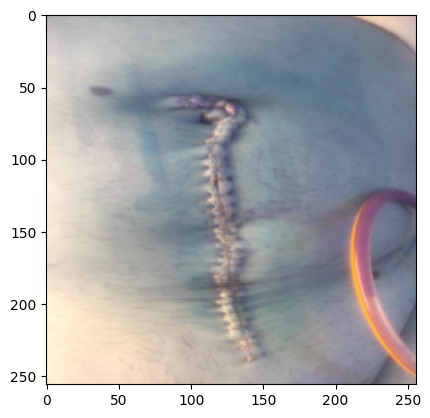

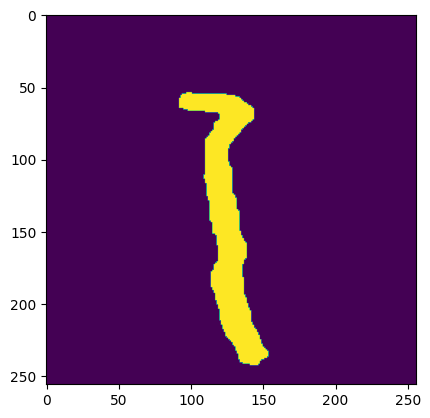

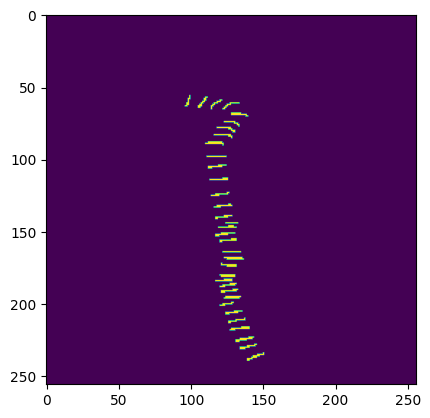

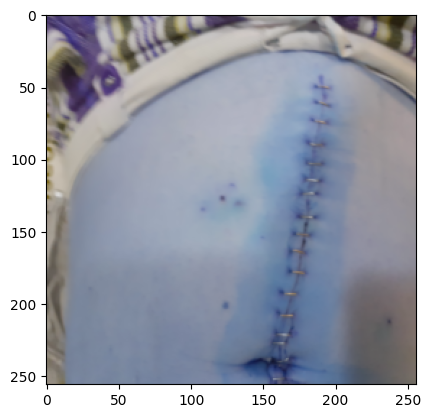

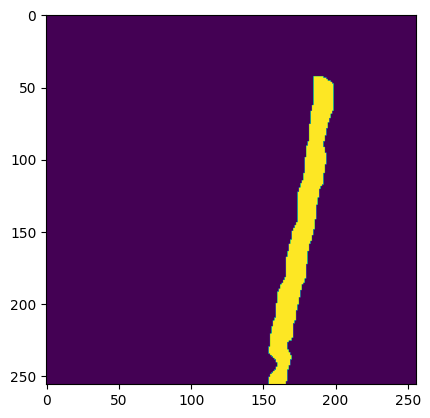

...

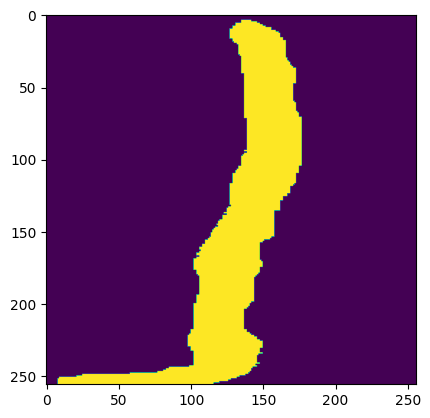

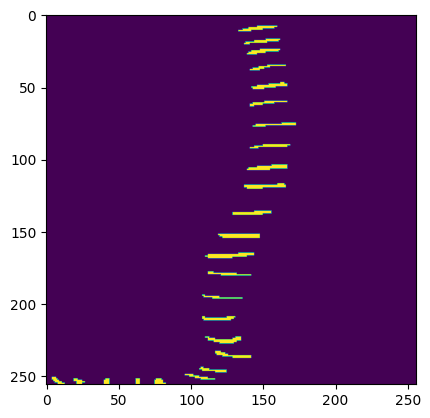

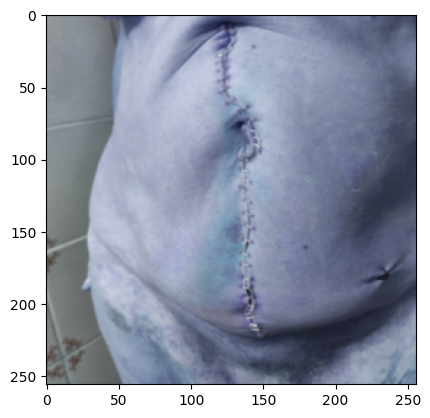

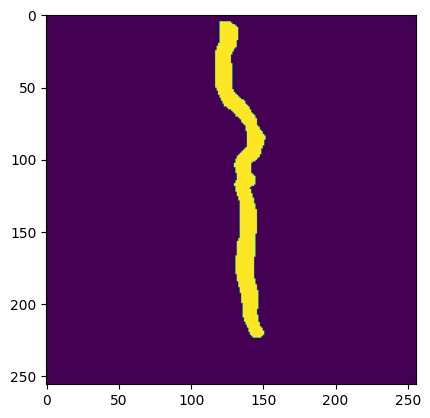

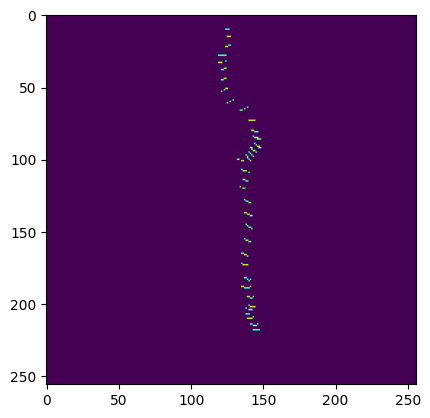

In [5]:
BATCH_SIZE = 5
for image_batch, mask_batch in cnn_generator(images=IMAGES_TRAIN,
                                             masks_wound=GROUND_TRUTHS_WOUND_TRAIN,
                                             masks_staple=GROUND_TRUTHS_STAPLE_TRAIN,
                                             batch_size=BATCH_SIZE):
    print(image_batch.shape, mask_batch.shape)
    for i in range(0, BATCH_SIZE):
        plt.imshow(image_batch[i,:,:,:])
        plt.show()
        plt.imshow(mask_batch[i,:,:,0])
        plt.show()
        plt.imshow(mask_batch[i,:,:,1])
        plt.show()
    break

(5, 256, 256, 3) (5, 256, 256, 2)


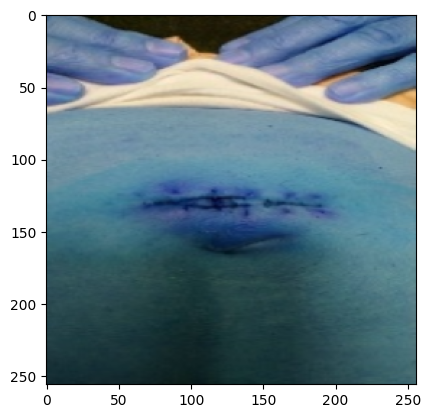

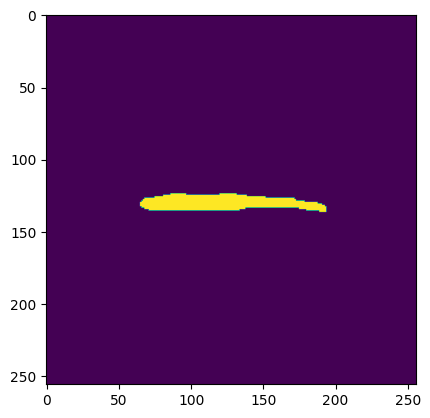

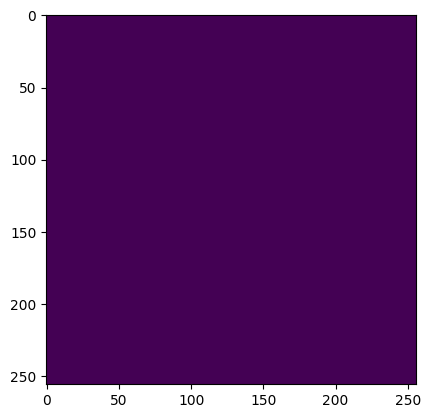

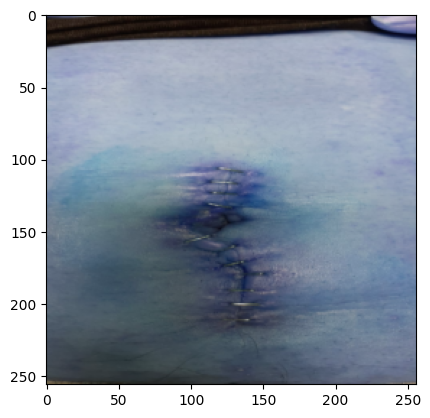

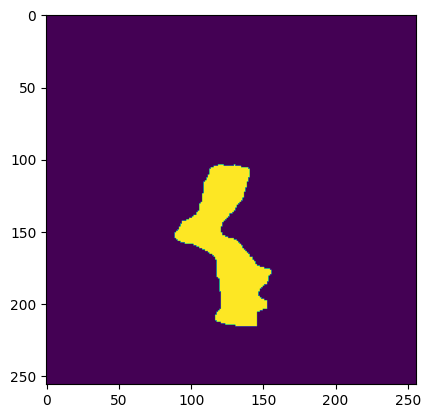

...

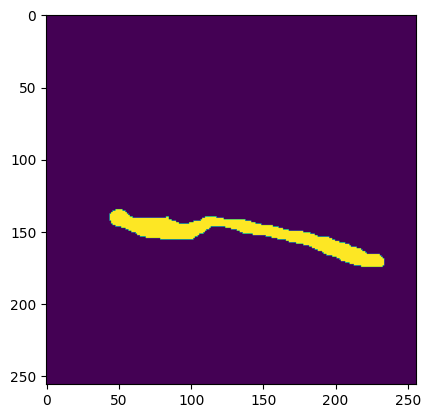

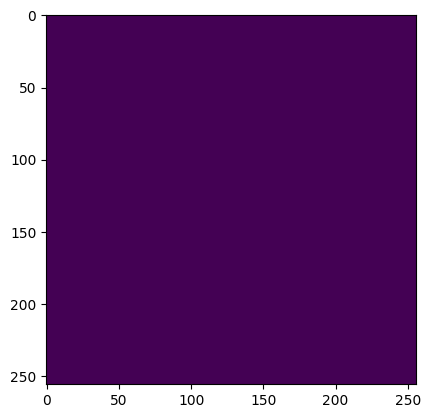

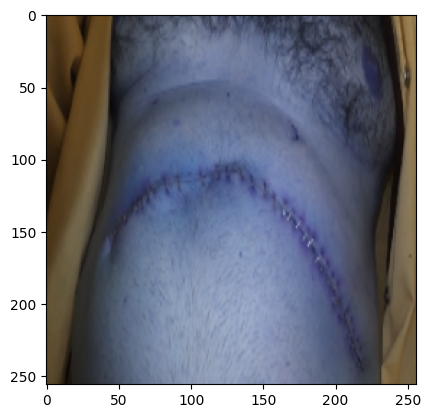

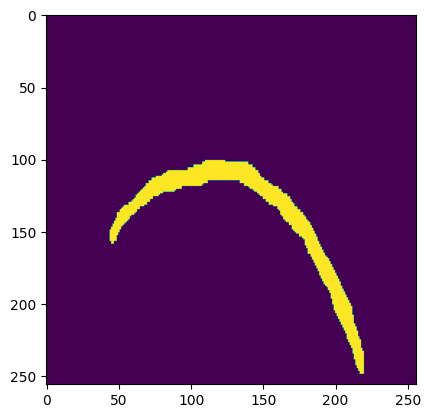

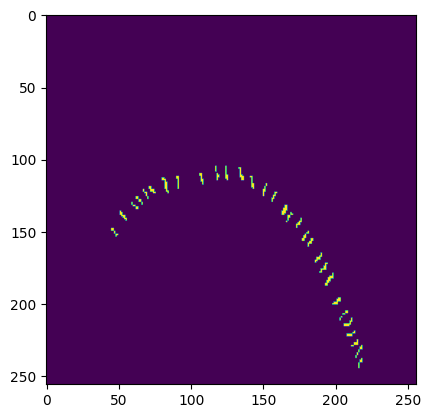

In [6]:
BATCH_SIZE = 5
for image_batch, mask_batch in cnn_generator(images=IMAGES_TEST,
                                             masks_wound=GROUND_TRUTHS_WOUND_TEST,
                                             masks_staple=GROUND_TRUTHS_STAPLE_TEST,
                                             batch_size=BATCH_SIZE):
    print(image_batch.shape, mask_batch.shape)
    for i in range(0, BATCH_SIZE):
        plt.imshow(image_batch[i,:,:,:])
        plt.show()
        plt.imshow(mask_batch[i,:,:,0])
        plt.show()
        plt.imshow(mask_batch[i,:,:,1])
        plt.show()
    break

## Implementació de la UNet

L'arquitectura UNet es va proposar per primera vegada a *U-Net: Convolutional Networks for Biomedical Image Segmentation*, per Ronneberger et al. És una xarxa del tipus codificador-decodificador, i la seva arquitectura es pot veure a la següent imatge.

El que farem serà implementar una funció per als blocs de codificació (els de l'esquerra), i una funció per als blocs de decodificació (els de la dreta).

In [7]:
# # idèntic a la UNET per a segmentació "simple"
# def encoder_block(inputs, num_filters):
#     # Convolution with 3x3 filter followed by ReLU activation 
#     x = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs) 
#     x = tf.keras.layers.Dropout(rate=0.5)(x)
#     x = tf.keras.layers.BatchNormalization()(x)
    
#     # Convolution with 3x3 filter followed by ReLU activation 
#     x = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=3, activation='relu', padding='same', kernel_initializer='he_normal')(x) 
#     x = tf.keras.layers.Dropout(rate=0.5)(x)
#     x = tf.keras.layers.BatchNormalization()(x)
    
#     # Max Pooling with 2x2 filter 
#     pooling = tf.keras.layers.MaxPool2D(pool_size = (2, 2), strides = 2)(x) 
      
#     return x, pooling

# def decoder_block(inputs, skip_features, num_filters): 
    
#     # Upsampling with 2x2 filter
#     up = tf.keras.layers.UpSampling2D(size = (2,2))(inputs)
#     x = tf.keras.layers.Convolution2D(num_filters, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(up)
#     x = tf.keras.layers.BatchNormalization()(x)
    
#     # Feature concatenation
#     x = tf.keras.layers.concatenate([skip_features, x], axis = 3)
    
#     # Convolution with 3x3 filter followed by ReLU activation 
#     x = tf.keras.layers.Convolution2D(num_filters, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(x)
#     x = tf.keras.layers.BatchNormalization()(x)
    
#     # Convolution with 3x3 filter followed by ReLU activation 
#     x = tf.keras.layers.Convolution2D(num_filters, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(x)
#     x = tf.keras.layers.BatchNormalization()(x)
    
#     return x

# idèntic a la UNET per a segmentació "simple"
def encoder_block(inputs, num_filters):
    # Convolution with 3x3 filter followed by ReLU activation 
    x = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=3, padding='same', kernel_initializer='he_normal')(inputs) 
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation(activations.relu)(x)
    
    # Convolution with 3x3 filter followed by ReLU activation 
    x = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=3, padding='same', kernel_initializer='he_normal')(x) 
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation(activations.relu)(x)
    
    # Max Pooling with 2x2 filter 
    pooling = tf.keras.layers.MaxPool2D(pool_size = (2, 2), strides = 2)(x) 
      
    return x, pooling

def decoder_block(inputs, skip_features, num_filters): 
    
    # Upsampling with 2x2 filter
    up = tf.keras.layers.UpSampling2D(size = (2,2))(inputs)
    x = tf.keras.layers.Convolution2D(num_filters, 2, padding = 'same', kernel_initializer = 'he_normal')(up)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation(activations.relu)(x)
    
    # Feature concatenation
    x = tf.keras.layers.concatenate([skip_features, x], axis = 3)
    
    # Convolution with 3x3 filter followed by ReLU activation 
    x = tf.keras.layers.Convolution2D(num_filters, 3, padding = 'same', kernel_initializer = 'he_normal')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation(activations.relu)(x)
    
    # Convolution with 3x3 filter followed by ReLU activation 
    x = tf.keras.layers.Convolution2D(num_filters, 3, padding = 'same', kernel_initializer = 'he_normal')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation(activations.relu)(x)
    
    return x

In [8]:
def build_unet(input_shape=Tuple[int, int, int]):
    inputs = tf.keras.layers.Input(input_shape) 
      
    # Contracting path 
    c1, p1 = encoder_block(inputs, 64) 
    c2, p2 = encoder_block(p1, 128) 
    c3, p3 = encoder_block(p2, 256) 
    c4, p4 = encoder_block(p3, 512) 
      
    # Bottleneck 
    b1 = tf.keras.layers.Conv2D(filters=1024, kernel_size=3, activation='relu', padding='same', kernel_initializer='he_normal')(p4) 
    b1 = tf.keras.layers.Dropout(rate=0.5)(b1)
    b1 = tf.keras.layers.BatchNormalization()(b1)
    b1 = tf.keras.layers.Conv2D(filters=1024, kernel_size=3, activation='relu', padding='same', kernel_initializer='he_normal')(b1) 
    b1 = tf.keras.layers.Dropout(rate=0.5)(b1)
    b1 = tf.keras.layers.BatchNormalization()(b1)
    
    # Expansive path per a ferides (ei's) i grapes (gi's)
    e1 = decoder_block(b1, c4, 512)
    g1 = decoder_block(b1, c4, 512)
    e2 = decoder_block(e1, c3, 256) 
    g2 = decoder_block(g1, c3, 256)  
    e3 = decoder_block(e2, c2, 128)
    g3 = decoder_block(g2, c2, 128)  
    e4 = decoder_block(e3, c1, 64) 
    g4 = decoder_block(g3, c1, 64)
    
    # Output 
    final_layer0 = tf.keras.layers.Convolution2D(filters=2, kernel_size=3, activation='relu', padding = 'same', kernel_initializer = 'he_normal')(e4)
    final_layer0 = tf.keras.layers.BatchNormalization()(final_layer0)
    
    outputs0 = tf.keras.layers.Conv2D(filters=1, kernel_size=1, activation='sigmoid', padding = 'same', kernel_initializer='he_normal')(final_layer0) 
    
    final_layer1 = tf.keras.layers.Convolution2D(filters=2, kernel_size=3, activation='relu', padding = 'same', kernel_initializer = 'he_normal')(g4)
    final_layer1 = tf.keras.layers.BatchNormalization()(final_layer1)
    
    outputs1 = tf.keras.layers.Conv2D(filters=1, kernel_size=1, activation='sigmoid', padding = 'same', kernel_initializer='he_normal')(final_layer1) 
    
    outputs = tf.keras.layers.concatenate([outputs0, outputs1], axis = -1) 
    
    model = tf.keras.models.Model(inputs = inputs, outputs = outputs, name = 'U-Net') 
    
    return model

## Entrenament de la UNet:

Ja ho tenim quasi a punt per a fer l'entrenament. Només ens queda definir la funció de pèrdua. Emprarem el coeficient de dice atès que és una mètrica emprada usualment en aquests casos.

In [9]:
def dice(y_true, y_pred):
    y_true_f = backend.flatten(y_true)
    y_pred_f = backend.flatten(y_pred)
    intersection = backend.sum(y_true_f * y_pred_f)
    return (2.* intersection+1) / (backend.sum(y_true_f) + backend.sum(y_pred_f)+1 )  
    
def dice_wound(y_true_multitask, y_pred_multitask):
    return dice(y_true_multitask[0], y_pred_multitask[0])

def dice_staple(y_true_multitask, y_pred_multitask):
    return dice(y_true_multitask[1], y_pred_multitask[1])

def dice_mean(y_true_multitask, y_pred_multitask):
    dice_f = dice_wound(y_true_multitask, y_pred_multitask)
    dice_g = dice_staple(y_true_multitask, y_pred_multitask)
    weight = 1/2
    return weight*dice_f + (1-weight)*dice_g

def dice_loss(y_true_multitask, y_pred_multitask):
    return 1-dice_mean(y_true_multitask, y_pred_multitask)


Cal fer unes proves per a determinar el LR i el nombre d'èpoques òptims per a l'entrenament de la nostra xarxa:

In [ ]:
alphas = [2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 7e-5, 5e-5]
for a in alphas:
    unet = build_unet(input_shape=(256, 256, 3))
    unet.compile(optimizer=Adam(learning_rate = a), loss=dice_loss, metrics = [dice_mean, dice_wound, dice_staple])
    
    BATCH_SIZE = 5
    TOTAL_IMAGES_TRAIN = 275
    TOTAL_IMAGES_TEST = 119
    STEPS_PER_EPOCH = TOTAL_IMAGES_TRAIN // BATCH_SIZE 
    VALIDATION_STEPS = TOTAL_IMAGES_TEST // BATCH_SIZE
    EPOCHS = 70

    reduceLROnPlat = ReduceLROnPlateau(monitor='dice_mean', factor=0.5,
                                       patience=3,
                                       verbose=1, mode='max', cooldown=2, min_lr=1e-7)
    early = EarlyStopping(monitor="dice_mean",
                          mode="max",
                          patience=8)

    CALLBACKS = [early, reduceLROnPlat]

    TRAIN_GENERATOR = cnn_generator(images=IMAGES_TRAIN,
                                masks_wound=GROUND_TRUTHS_WOUND_TRAIN,
                                masks_staple=GROUND_TRUTHS_STAPLE_TRAIN,
                                batch_size=BATCH_SIZE)

    TEST_GENERATOR = cnn_generator(images=IMAGES_TEST,
                                   masks_wound=GROUND_TRUTHS_WOUND_TEST,
                                   masks_staple=GROUND_TRUTHS_STAPLE_TEST,
                                   batch_size=BATCH_SIZE)
    
    training_history = unet.fit(TRAIN_GENERATOR, 
                           validation_data=TEST_GENERATOR,
                           epochs=EPOCHS,
                           validation_steps=2,
                           callbacks=CALLBACKS,
                           steps_per_epoch=STEPS_PER_EPOCH)
    
    plt.figure(figsize=(9,6), dpi= 100, facecolor='w', edgecolor='k')

    plt.subplot(1,2,1)
    plt.plot(training_history.history['dice_mean'])
    plt.plot(training_history.history['val_dice_mean'])
    plt.title('Dice evolution')
    plt.ylabel('dice')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')

    # "Loss"
    plt.subplot(1,2,2)
    plt.plot(training_history.history['loss'])
    plt.plot(training_history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')

    EXPERIMENT_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment01'
    plt.savefig(EXPERIMENT_PATH+rf"/unet_multitasca_rendiment_prova_{a}.png")
    
    del unet

Prenem com òptim el següent:

2024-06-30 00:41:01.605454: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2024-06-30 00:41:01.644225: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:06:00.0 name: GeForce GTX 1080 Ti computeCapability: 6.1
coreClock: 1.582GHz coreCount: 28 deviceMemorySize: 10.92GiB deviceMemoryBandwidth: 451.17GiB/s
2024-06-30 00:41:01.644279: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2024-06-30 00:41:01.646431: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2024-06-30 00:41:01.648586: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcufft.so.10
2024-06-30 00:41:01.648934: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcurand.so

Epoch 1/50


2024-06-30 00:41:06.671541: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudnn.so.7
2024-06-30 00:41:07.474088: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10


55/55 [==============================] - 20s 360ms/step - loss: 0.8849 - dice_mean: 0.1151 - dice_wound: 0.1139 - dice_staple: 0.1163 - val_loss: 0.9540 - val_dice_mean: 0.0460 - val_dice_wound: 0.0258 - val_dice_staple: 0.0662
Epoch 2/50
55/55 [==============================] - 19s 349ms/step - loss: 0.8695 - dice_mean: 0.1305 - dice_wound: 0.1299 - dice_staple: 0.1311 - val_loss: 0.9604 - val_dice_mean: 0.0396 - val_dice_wound: 0.0536 - val_dice_staple: 0.0256
Epoch 3/50
55/55 [==============================] - 19s 351ms/step - loss: 0.8611 - dice_mean: 0.1389 - dice_wound: 0.1350 - dice_staple: 0.1428 - val_loss: 0.7820 - val_dice_mean: 0.2180 - val_dice_wound: 0.2833 - val_dice_staple: 0.1528
Epoch 4/50
55/55 [==============================] - 19s 352ms/step - loss: 0.8441 - dice_mean: 0.1559 - dice_wound: 0.1527 - dice_staple: 0.1591 - val_loss: 0.8968 - val_dice_mean: 0.1032 - val_dice_wound: 0.0942 - val_dice_staple: 0.1122
Epoch 5/50
55/55 [==============================] - 20s

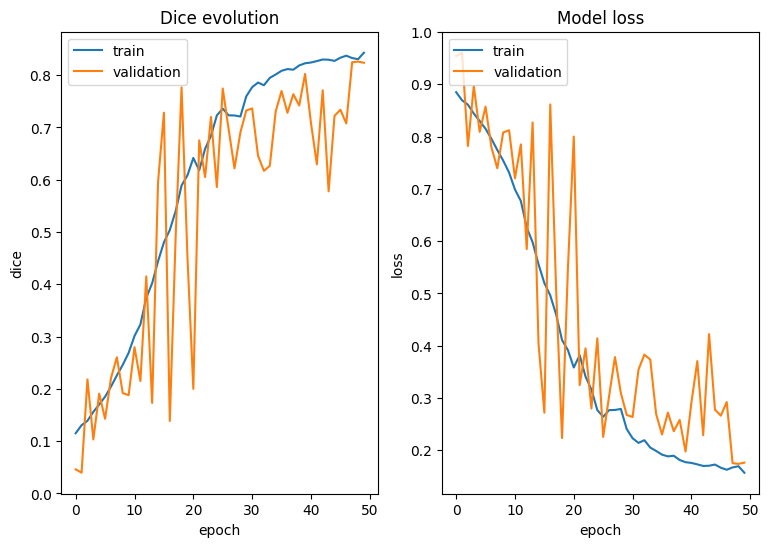

In [10]:
unet = build_unet(input_shape=(256, 256, 3))
unet.compile(optimizer=Adam(learning_rate = 7e-4), loss=dice_loss, metrics = [dice_mean, dice_wound, dice_staple])

BATCH_SIZE = 5
TOTAL_IMAGES_TRAIN = 275
TOTAL_IMAGES_TEST = 119
STEPS_PER_EPOCH = TOTAL_IMAGES_TRAIN // BATCH_SIZE 
VALIDATION_STEPS = TOTAL_IMAGES_TEST // BATCH_SIZE
EPOCHS = 50

reduceLROnPlat = ReduceLROnPlateau(monitor='dice_mean', factor=0.5,
                                   patience=3,
                                   verbose=1, mode='max', cooldown=2, min_lr=1e-7)
early = EarlyStopping(monitor="dice_mean",
                      mode="max",
                      patience=8)

CALLBACKS = [early, reduceLROnPlat]

TRAIN_GENERATOR = cnn_generator(images=IMAGES_TRAIN,
                            masks_wound=GROUND_TRUTHS_WOUND_TRAIN,
                            masks_staple=GROUND_TRUTHS_STAPLE_TRAIN,
                            batch_size=BATCH_SIZE)

TEST_GENERATOR = cnn_generator(images=IMAGES_TEST,
                               masks_wound=GROUND_TRUTHS_WOUND_TEST,
                               masks_staple=GROUND_TRUTHS_STAPLE_TEST,
                               batch_size=BATCH_SIZE)

training_history = unet.fit(TRAIN_GENERATOR, 
                       validation_data=TEST_GENERATOR,
                       epochs=EPOCHS,
                       validation_steps=2,
                       callbacks=CALLBACKS,
                       steps_per_epoch=STEPS_PER_EPOCH)

plt.figure(figsize=(9,6), dpi= 100, facecolor='w', edgecolor='k')

plt.subplot(1,2,1)
plt.plot(training_history.history['dice_mean'])
plt.plot(training_history.history['val_dice_mean'])
plt.title('Dice evolution')
plt.ylabel('dice')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

# "Loss"
plt.subplot(1,2,2)
plt.plot(training_history.history['loss'])
plt.plot(training_history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

EXPERIMENT_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment01'
plt.savefig(EXPERIMENT_PATH+rf"/unet_multitasca_rendiment.png")

In [12]:
# guardam el model
EXPERIMENT_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment01'
unet.save(os.path.join(EXPERIMENT_PATH, "unet_multitasca.h5"))

In [10]:
EXPERIMENT_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment01'
from tensorflow.keras.models import load_model
loaded_model = load_model(os.path.join(EXPERIMENT_PATH, "unet_multitasca.h5"), 
                          custom_objects={'dice_loss': dice_loss, 
                                          'dice_mean': dice_mean,
                                          'dice_wound': dice_wound, 
                                          'dice_staple': dice_staple,
                                          'dice': dice})

2024-07-01 16:08:01.160456: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2024-07-01 16:08:01.187050: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:06:00.0 name: GeForce GTX 1080 Ti computeCapability: 6.1
coreClock: 1.582GHz coreCount: 28 deviceMemorySize: 10.92GiB deviceMemoryBandwidth: 451.17GiB/s
2024-07-01 16:08:01.187121: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2024-07-01 16:08:01.188764: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2024-07-01 16:08:01.190185: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcufft.so.10
2024-07-01 16:08:01.190446: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcurand.so

## Prediccions amb la UNet

Fins ara hem implementat la UNet, l'hem entrenat i hem guardat els pesos a un fitxer per a poder fer futures prediccions. Això és el que pretenem fer en aquesta secció: passar-li una imatge a la UNet, i que ens faci la predicció. És important observar un fet: quan li passam imatges amb el generador, li estem donant amb una certa mida, i la xarxa ens torna les imatges també amb una certa mida de sortida. Però clar, no totes les imatges del dataset tenen la mateixa mida, ni tampoc tenen la mateixa mida $256\times 256$ que li imposam a la xarxa. Per aquest motiu, és important establir un criteri. Com que les màscares ens determinen la posició exacta de l'objecte, farem el següent:

1. Donada una imatge sobre la que volem fer la predicció, canviar la seva mida a la dimensió d'entrada de la xarxa.
2. Calcular la predicció del model, que ens tornarà una imatge en la dimensió de sortida del mateix. Aquesta sortida serà, **en el cas de la UNet**, una imatge amb entrades dins l'interval $[0,1]$, que podem interpretar com una imatge en escala de grisos.
3. Redimensionar aquesta sortida amb les dimensions de la imatge en qüestió.
4. Binaritzar el resultat de la passa anterior.
5. Comparar amb la màscara.

Un dubte que pot sorgir és si les passes 3 i 4 es poden permutar. La resposta és que no. Si primer binaritzam, quan facem el canvi d'escala posterior la imatge resultant **no** és, en general, binària. Hem de pensar que fer un canvi d'escala aplica per darrere una sèrie de tècniques d'interpolació, que poden donar lloc a imatges en escala de grisos, que no són comparables a la passa 4 amb la màscara final.

In [11]:
def predict_image(model: tf.keras.models.Model, model_input: Tuple[int, int], image: numpy.ndarray, binary_threshold: float=0.5):
    # PREDICCIÓ FERIDA
    resized_image = skimage.transform.resize(image, (model_input[0], model_input[1], 3)) #Passa 1
    prediction_raw = model.predict(numpy.array([resized_image])) # Passa 2
    
    # Passa 3
    prediction_0 = prediction_raw[0][:,:,0]
    prediction_resized_0 = skimage.transform.resize(prediction_0, (image.shape[0], image.shape[1]))
    prediction_binary_bool_0 = prediction_resized_0 >= binary_threshold
    prediction_binary_f = 255*prediction_binary_bool_0
    #prediction_binary_f = tf.cast(prediction_binary_f, dtype=tf.int32)
    
    # PREDICCIÓ GRAPA
    prediction_1 = prediction_raw[0][:,:,1]
    prediction_resized_1 = skimage.transform.resize(prediction_1, (image.shape[0], image.shape[1]))
    prediction_binary_bool_1 = prediction_resized_1 >= binary_threshold
    prediction_binary_g = 255*prediction_binary_bool_1
    #prediction_binary_g = tf.cast(prediction_binary_g, dtype=tf.int32)
    
    
    return prediction_binary_f, prediction_binary_g

Ara implementarem dues funcions que reben per paràmetres la gt i la predicció i ens retornen la mètrica: la dice i la jaccard.

In [20]:
from sklearn.metrics import confusion_matrix
def metriques_absolutes(gt_image, prediction):
    (n,m) = numpy.shape(gt_image)  
    
    if (n,m) != numpy.shape(prediction): # comprovació que les mides de la imatge de la predicció i la de la gt coincideixen
        return []
    
    # si les mides coincideixen, calcularem les mètriques absolutes
    # Convert images to binary arrays
    gt_binary = numpy.asarray(gt_image).ravel()
    gt_binary = gt_binary.astype(int)
    gt_binary = 255*gt_binary
    prediction_binary = numpy.asarray(prediction).ravel()
    
    # Calculate confusion matrix
    cm = confusion_matrix(gt_binary, prediction_binary)
    if cm.shape[0] > 1 and cm.shape[1] > 1:
        tn, fp, fn, tp = confusion_matrix(gt_binary, prediction_binary).ravel()
        return [tp, fn, fp, tn]
    return [confusion_matrix(gt_binary, prediction_binary)[0]]

In [21]:
def dice_coefficient(gt_image, prediction):
    metriques = metriques_absolutes(gt_image, prediction)  
    
    if len(metriques)<=1:
        return []
    
    [tp,fn,fp,tn] = metriques
    # calculem el valor del coeficient de dice
    if (2*tp + fp + fn) == 0: #això voldria dir que tots el coefs. són TN i, per tant, ho fa bé
        dice = 1
    else:
        dice = 2*tp/(2*tp + fp + fn)
    
    return [tp,fn,fp,tn,dice]

In [22]:
# def jaccard_coefficient(gt_image, prediction):
#     metriques = metriques_absolutes(gt_image, prediction)
    
#     if metriques == []:
#         return []
    
#     [tp,fn,fp,tn] = metriques
#     # calculem el valor del coeficient de jaccard
#     if (tp + fp + fn) == 0: #com abans, la predicció és bona
#         jaccard = 1
#     else:
#         jaccard = tp/(tp + fp + fn)
    
#     return [tp,fn,fp,tn,jaccard]

In [14]:
import pandas as pd
# Read the .txt file into a DataFrame
path_train = os.path.join(REDSCAR_DATASET, 'SUBSETS', 'MACHINE_LEARNING_DATASET', 'train.txt')
df = pd.read_csv(path_train, header=None)

# Convert DataFrame to a flattened list
noms_train = df.values.ravel().tolist()

In [15]:
def train_eval(xarxa, alpha):
    noms_imatges = []

    dice_imatges_f = []
    jaccard_imatges_f = []
    tp_imatges_f = []
    fn_imatges_f = []
    fp_imatges_f = []
    tn_imatges_f = []

    dice_imatges_g = []
    jaccard_imatges_g = []
    tp_imatges_g = []
    fn_imatges_g = []
    fp_imatges_g = []
    tn_imatges_g = []

    dice_mean = []
    jaccard_mean = []

    for i in range(len(IMAGES_TRAIN)):
        print(i)

        #noms_imatges.append(noms_train[i])

        imatge = IMAGES_TRAIN[i] # en color
        gt_image_f = GROUND_TRUTHS_WOUND_TRAIN[i] # escala de grisos
        gt_image_g = GROUND_TRUTHS_STAPLE_TRAIN[i] # escala de grisos

        #feim les prediccions
        prediction_f, prediction_g = predict_image(model=xarxa, model_input=(256, 256), image=imatge)

        #avaluam amb cada mètrica
        dice_resultat_f = dice_coefficient(gt_image_f, prediction_f)
        if dice_resultat_f != []:
            # guardam els resultats de ferida
            dice_f = dice_resultat_f[-1]
            dice_imatges_f.append(dice_f)
            jaccard_f = dice_f/(2-dice_f) 
            jaccard_imatges_f.append(jaccard_f)
            tp_f = dice_resultat_f[0]
            tp_imatges_f.append(tp_f)
            fn_f = dice_resultat_f[1]
            fn_imatges_f.append(fn_f)
            fp_f = dice_resultat_f[2]
            fp_imatges_f.append(fp_f)
            tn_f = dice_resultat_f[3]
            tn_imatges_f.append(tn_f)

            # i ara, els de grapa
            dice_resultat_g = dice_coefficient(gt_image_g, prediction_g)
            if dice_resultat_g != []: 
                dice_g = dice_resultat_g[-1]
                dice_imatges_g.append(dice_g)
                jaccard_g = dice_g/(2-dice_g) 
                jaccard_imatges_g.append(jaccard_g)
                tp_g = dice_resultat_g[0]
                tp_imatges_g.append(tp_g)
                fn_g = dice_resultat_g[1]
                fn_imatges_g.append(fn_g)
                fp_g = dice_resultat_g[2]
                fp_imatges_g.append(fp_g)
                tn_g = dice_resultat_g[3]
                tn_imatges_g.append(tn_g)

                dice_m = (dice_f + dice_g)/2
                dice_mean.append(dice_m)

                jaccard_m = (jaccard_f + jaccard_g)/2
                jaccard_mean.append(jaccard_m)

            else:
                dice_imatges_g.append(None)
                jaccard_imatges_g.append(None)
                tp_imatges_g.append(None)
                fp_imatges_g.append(None)
                fn_imatges_g.append(None)
                tn_imatges_g.append(None)

                dice_mean.append(None)
                jaccard_mean.append(None)


        else:
            dice_imatges_f.append(None)
            jaccard_imatges_f.append(None)
            tp_imatges_f.append(None)
            fp_imatges_f.append(None)
            fn_imatges_f.append(None)
            tn_imatges_f.append(None)

            dice_imatges_g.append(None)
            jaccard_imatges_g.append(None)
            tp_imatges_g.append(None)
            fp_imatges_g.append(None)
            fn_imatges_g.append(None)
            tn_imatges_g.append(None)

            dice_mean.append(None)
            jaccard_mean.append(None)

    # cream un DataFrame
    unet_train = pd.DataFrame({'NOM': noms_train, 'DICE_f': dice_imatges_f, 'JACCARD_f': jaccard_imatges_f, 'TP_f': tp_imatges_f, 'FN_f': fn_imatges_f, 'FP_f': fp_imatges_f, 'TN_f': tn_imatges_f,
                                'DICE_g': dice_imatges_g, 'JACCARD_g': jaccard_imatges_g, 'TP_g': tp_imatges_g, 'FN_g': fn_imatges_g, 'FP_g': fp_imatges_g, 'TN_g': tn_imatges_g,
                                'DICE_mean': dice_mean, 'JACCARD_mean': jaccard_mean})

    # el guardam com un arxiu .csv en la carpeta resultats
    RESULTATS_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment01'
    unet_train.to_csv(EXPERIMENT_PATH+rf"/unet_multitasca_train_prova_{alpha}.csv", index=False)


In [16]:
# Read the .txt file into a DataFrame
path_test = os.path.join(REDSCAR_DATASET, 'SUBSETS', 'MACHINE_LEARNING_DATASET', 'test.txt')
df = pd.read_csv(path_test, header=None)

# Convert DataFrame to a flattened list
noms_test = df.values.ravel().tolist()

In [17]:
def test_eval(xarxa, alpha):
    noms_imatges = []

    dice_imatges_f = []
    jaccard_imatges_f = []
    tp_imatges_f = []
    fn_imatges_f = []
    fp_imatges_f = []
    tn_imatges_f = []

    dice_imatges_g = []
    jaccard_imatges_g = []
    tp_imatges_g = []
    fn_imatges_g = []
    fp_imatges_g = []
    tn_imatges_g = []

    dice_mean = []
    jaccard_mean = []

    for i in range(len(IMAGES_TEST)):
        #noms_imatges.append(noms_train[i])

        imatge = IMAGES_TEST[i] # en color
        gt_image_f = GROUND_TRUTHS_WOUND_TEST[i] # escala de grisos
        gt_image_g = GROUND_TRUTHS_STAPLE_TEST[i] # escala de grisos

        #feim les prediccions
        prediction_f, prediction_g = predict_image(model=xarxa, model_input=(256, 256), image=imatge)

        #avaluam amb cada mètrica
        dice_resultat_f = dice_coefficient(gt_image_f, prediction_f)
        if dice_resultat_f != []:
            # guardam els resultats de ferida
            dice_f = dice_resultat_f[-1]
            dice_imatges_f.append(dice_f)
            jaccard_f = dice_f/(2-dice_f) 
            jaccard_imatges_f.append(jaccard_f)
            tp_f = dice_resultat_f[0]
            tp_imatges_f.append(tp_f)
            fn_f = dice_resultat_f[1]
            fn_imatges_f.append(fn_f)
            fp_f = dice_resultat_f[2]
            fp_imatges_f.append(fp_f)
            tn_f = dice_resultat_f[3]
            tn_imatges_f.append(tn_f)

            # i ara, els de grapa
            dice_resultat_g = dice_coefficient(gt_image_g, prediction_g)
            if dice_resultat_g != []: 
                dice_g = dice_resultat_g[-1]
                dice_imatges_g.append(dice_g)
                jaccard_g = dice_g/(2-dice_g) 
                jaccard_imatges_g.append(jaccard_g)
                tp_g = dice_resultat_g[0]
                tp_imatges_g.append(tp_g)
                fn_g = dice_resultat_g[1]
                fn_imatges_g.append(fn_g)
                fp_g = dice_resultat_g[2]
                fp_imatges_g.append(fp_g)
                tn_g = dice_resultat_g[3]
                tn_imatges_g.append(tn_g)

                dice_m = (dice_f + dice_g)/2
                dice_mean.append(dice_m)

                jaccard_m = (jaccard_f + jaccard_g)/2
                jaccard_mean.append(jaccard_m)

            else:
                dice_imatges_g.append(None)
                jaccard_imatges_g.append(None)
                tp_imatges_g.append(None)
                fp_imatges_g.append(None)
                fn_imatges_g.append(None)
                tn_imatges_g.append(None)

                dice_mean.append(None)
                jaccard_mean.append(None)


        else:
            dice_imatges_f.append(None)
            jaccard_imatges_f.append(None)
            tp_imatges_f.append(None)
            fp_imatges_f.append(None)
            fn_imatges_f.append(None)
            tn_imatges_f.append(None)

            dice_imatges_g.append(None)
            jaccard_imatges_g.append(None)
            tp_imatges_g.append(None)
            fp_imatges_g.append(None)
            fn_imatges_g.append(None)
            tn_imatges_g.append(None)

            dice_mean.append(None)
            jaccard_mean.append(None)

    # cream un DataFrame
    unet_test = pd.DataFrame({'NOM': noms_test, 'DICE_f': dice_imatges_f, 'JACCARD_f': jaccard_imatges_f, 'TP_f': tp_imatges_f, 'FN_f': fn_imatges_f, 'FP_f': fp_imatges_f, 'TN_f': tn_imatges_f,
                                'DICE_g': dice_imatges_g, 'JACCARD_g': jaccard_imatges_g, 'TP_g': tp_imatges_g, 'FN_g': fn_imatges_g, 'FP_g': fp_imatges_g, 'TN_g': tn_imatges_g,
                                'DICE_mean': dice_mean, 'JACCARD_mean': jaccard_mean})

    # el guardam com un arxiu .csv en la carpeta resultats
    RESULTATS_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment01'
    unet_test.to_csv(EXPERIMENT_PATH+rf"/unet_multitasca_test_prova_{alpha}.csv", index=False)


In [ ]:
dubtosos = [6e-4, 7e-4, 8e-4]
for d in dubtosos:
    # primer, cal inicialitzar la xarxa i entrenar-la amb els nous paràmetres:
    unet = build_unet(input_shape=(256, 256, 3))
    unet.compile(optimizer=Adam(learning_rate = d), loss=dice_loss, metrics = [dice_mean, dice_wound, dice_staple])
    
    BATCH_SIZE = 5
    TOTAL_IMAGES_TRAIN = 275
    TOTAL_IMAGES_TEST = 119
    STEPS_PER_EPOCH = TOTAL_IMAGES_TRAIN // BATCH_SIZE 
    VALIDATION_STEPS = TOTAL_IMAGES_TEST // BATCH_SIZE
    EPOCHS = 50

    reduceLROnPlat = ReduceLROnPlateau(monitor='dice_mean', factor=0.5,
                                       patience=3,
                                       verbose=1, mode='max', cooldown=2, min_lr=1e-7)
    early = EarlyStopping(monitor="dice_mean",
                          mode="max",
                          patience=8)

    CALLBACKS = [early, reduceLROnPlat]

    TRAIN_GENERATOR = cnn_generator(images=IMAGES_TRAIN,
                                masks_wound=GROUND_TRUTHS_WOUND_TRAIN,
                                masks_staple=GROUND_TRUTHS_STAPLE_TRAIN,
                                batch_size=BATCH_SIZE)

    TEST_GENERATOR = cnn_generator(images=IMAGES_TEST,
                                   masks_wound=GROUND_TRUTHS_WOUND_TEST,
                                   masks_staple=GROUND_TRUTHS_STAPLE_TEST,
                                   batch_size=BATCH_SIZE)
    
    training_history = unet.fit(TRAIN_GENERATOR, 
                           validation_data=TEST_GENERATOR,
                           epochs=EPOCHS,
                           validation_steps=2,
                           callbacks=CALLBACKS,
                           steps_per_epoch=STEPS_PER_EPOCH)
    
    plt.figure(figsize=(9,6), dpi= 100, facecolor='w', edgecolor='k')

    plt.subplot(1,2,1)
    plt.plot(training_history.history['dice_mean'])
    plt.plot(training_history.history['val_dice_mean'])
    plt.title('Dice evolution')
    plt.ylabel('dice')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')

    # "Loss"
    plt.subplot(1,2,2)
    plt.plot(training_history.history['loss'])
    plt.plot(training_history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')

    EXPERIMENT_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment01'
    plt.savefig(EXPERIMENT_PATH+rf"/unet_multitasca_rendiment_prova2_{d}.png")
    
    # ara, avaluem-la:
    train_eval(unet, d)
    test_eval(unet, d)
    
    # en darrer lloc, cal esborrar-la 
    del unet

2024-06-05 11:37:58.797676: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2024-06-05 11:37:58.842750: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:05:00.0 name: GeForce GTX 1080 Ti computeCapability: 6.1
coreClock: 1.582GHz coreCount: 28 deviceMemorySize: 10.91GiB deviceMemoryBandwidth: 451.17GiB/s
2024-06-05 11:37:58.842817: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2024-06-05 11:37:58.845554: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2024-06-05 11:37:58.847887: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcufft.so.10
2024-06-05 11:37:58.848353: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcurand.so

Epoch 1/50


2024-06-05 11:38:03.495003: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudnn.so.7
2024-06-05 11:38:04.339768: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10


55/55 [==============================] - 20s 362ms/step - loss: 0.8840 - dice_mean: 0.1160 - dice_wound: 0.1125 - dice_staple: 0.1196 - val_loss: 0.9711 - val_dice_mean: 0.0289 - val_dice_wound: 0.0185 - val_dice_staple: 0.0392
Epoch 2/50
55/55 [==============================] - 19s 350ms/step - loss: 0.8690 - dice_mean: 0.1310 - dice_wound: 0.1295 - dice_staple: 0.1325 - val_loss: 0.9521 - val_dice_mean: 0.0479 - val_dice_wound: 0.0642 - val_dice_staple: 0.0316
Epoch 3/50
55/55 [==============================] - 19s 351ms/step - loss: 0.8633 - dice_mean: 0.1367 - dice_wound: 0.1336 - dice_staple: 0.1398 - val_loss: 0.8669 - val_dice_mean: 0.1331 - val_dice_wound: 0.1727 - val_dice_staple: 0.0935
Epoch 4/50
55/55 [==============================] - 19s 353ms/step - loss: 0.8527 - dice_mean: 0.1473 - dice_wound: 0.1464 - dice_staple: 0.1483 - val_loss: 0.9358 - val_dice_mean: 0.0642 - val_dice_wound: 0.0736 - val_dice_staple: 0.0549
Epoch 5/50
55/55 [==============================] - 20s

55/55 [==============================] - 21s 373ms/step - loss: 0.5439 - dice_mean: 0.4561 - dice_wound: 0.4614 - dice_staple: 0.4508 - val_loss: 0.7261 - val_dice_mean: 0.2739 - val_dice_wound: 0.2535 - val_dice_staple: 0.2943
Epoch 15/50
55/55 [==============================] - 21s 373ms/step - loss: 0.5162 - dice_mean: 0.4838 - dice_wound: 0.4843 - dice_staple: 0.4833 - val_loss: 0.7157 - val_dice_mean: 0.2843 - val_dice_wound: 0.2896 - val_dice_staple: 0.2791
Epoch 16/50
55/55 [==============================] - 20s 371ms/step - loss: 0.4767 - dice_mean: 0.5233 - dice_wound: 0.5266 - dice_staple: 0.5201 - val_loss: 0.3743 - val_dice_mean: 0.6257 - val_dice_wound: 0.6064 - val_dice_staple: 0.6451
Epoch 17/50
55/55 [==============================] - 20s 371ms/step - loss: 0.4547 - dice_mean: 0.5453 - dice_wound: 0.5475 - dice_staple: 0.5432 - val_loss: 0.8376 - val_dice_mean: 0.1624 - val_dice_wound: 0.2014 - val_dice_staple: 0.1234
Epoch 18/50
55/55 [==============================] -

## Algunes prediccions:
Per a poder veure com de bé ho fa la xarxa UNet, guardarem algunes prediccions. En aquest cas, seleccionarem 15 imatges del DS (les 10 millors segons la mètrica dice i les 5 pitjors) i en guardarem a la carpeta 'Resultats' 

Ara implementarem diverses funcions per a obtenir visualitzacions dels resultats

In [12]:
# funció ppal que cridarà a les altres:
def visualitzacions(model, noms_imatges: list, ruta_imatges: str, rutes_gt: list, input_size: int, ruta_guardar: str, titol: str):
    k = 1 
    for nom in noms_imatges:
        if nom.endswith('resolution=1.png'):
            qualitat = 1
        else:
            qualitat = 0
        # carregam la imatge, les gts i feim les prediccions
        imatge = cv2.imread(os.path.join(ruta_imatges, nom), 1) # en color
        gt_f = cv2.imread(os.path.join(rutes_gt[0], nom), 0) # escala de grisos
        gt_g = cv2.imread(os.path.join(rutes_gt[1], nom), 0) # escala de grisos
        prediccio_f, prediccio_g = predict_image(model=model, model_input=(input_size, input_size), image=imatge)
        
        # cridam a la funció que dibuixa les prediccions sobre la imatge original
        res1_f = mascara(imatge,prediccio_f)
        cv2.imwrite(ruta_guardar+rf"/{titol}_{k}_mascara_f.png", res1_f)
        res1_g = mascara(imatge,prediccio_g)
        cv2.imwrite(ruta_guardar+rf"/{titol}_{k}_mascara_g.png", res1_g)
        
        # cridam a la funció que dibuixa els contorns de la predicció i de la gt sobre la imatge original
        res2_f = contorns(imatge, prediccio_f, gt_f, qualitat)
        cv2.imwrite(ruta_guardar+rf"/{titol}_{k}_contorns_f.png", res2_f)
        plt.imshow(res2_f)
        plt.show()
        
        res2_g = contorns(imatge, prediccio_g, gt_g, qualitat)
        cv2.imwrite(ruta_guardar+rf"/{titol}_{k}_contorns_g.png", res2_g)
        plt.imshow(res2_g)
        plt.show()
        
        k += 1

In [13]:
# funció auxiliar que dibuixa la predicció sobre la imatge original:
def mascara(imatge, prediccio):
    mascara = imatge.copy()
    for i in range(imatge.shape[0]):
        for j in range(imatge.shape[1]):
            if prediccio[i, j] > 0:  
                mascara[i, j] = [107,183,189]  # Paint in yellow
    return mascara    

In [14]:
# funció auxiliar que dibuixa els contorns de la gt i de la prediccio sobre la imatge original:
# color gt = green; color prediccio = red
def contorns(imatge, prediccio, gt, qualitat):
    resultat = imatge.copy()
    # PREDICCIO
    # find contours with hierarchy
    contours, hier = cv2.findContours(prediccio.astype(numpy.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
                                                # how the contours are retrieved and organized, contour approximation method
    # Define sufficient enough colors for blobs (taques)
    colors = [(0, 255, 0), (0, 0, 255)] # green and red (BGR format)
    k = -1
    for i, cnt in enumerate(contours):
        if (hier[0, i, 3] == -1):  # Check if the current contour has no parent, i.e., the contour is an external contour
            k += 1
        if qualitat == 1:
            cv2.drawContours(resultat, [cnt], -1, colors[1], 5) #pintam la predicció de vermell
        else:
            cv2.drawContours(resultat, [cnt], -1, colors[1], 1) #pintam la predicció de vermell

        
    # GT
    # find contours with hierarchy
    contours, hier = cv2.findContours(gt.astype(numpy.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
                                                # how the contours are retrieved and organized, contour approximation method
    k = -1
    for i, cnt in enumerate(contours):
        if (hier[0, i, 3] == -1):  # Check if the current contour has no parent, i.e., the contour is an external contour
            k += 1
        if qualitat == 1:
            cv2.drawContours(resultat, [cnt], -1, colors[0], 5) #pintam la gt de verd
        else:
            cv2.drawContours(resultat, [cnt], -1, colors[0], 1) #pintam la gt de verd
    return resultat

Ara sí, dibuixem les prediccions i guardem els resultats

## Filtratge 1: millors i pitjors imatges d'alta resolució

In [16]:
#carregam el df
# carregam el data frame de test:
import pandas as pd
df = pd.read_csv('/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment01/unet_multitasca_test_prova_0.0007.csv')

# filtram les imatges d'alta resolució -> df1:
df1 = df[df['NOM'].str.endswith('resolution=1.png')]

# eliminam les que NO tenen cap grapa
noms_sense = ['qfBqdnHgJkPwfL4apJ8o2N4na_infection=0_capture=1_resolution=1.png',
              'KnclSSvSGyJt26zuAelrcgQ6b_infection=0_capture=1_resolution=1.png',
             'djnIcpMtGUmA2PAxIYTDpdD9y_infection=0_capture=1_resolution=1.png',
             'YzLNpYW33lmFgkqNRUKgIzj1J_infection=0_capture=1_resolution=1.png']
df1 = df1[~df1['NOM'].isin(noms_sense)].reset_index(drop=True)

# l'ordenam en funció del coeficient dice
df1_sorted = df1.sort_values(by='DICE_mean',ascending=False).reset_index(drop=True)# ordenem el df de major a menor coef. de dice
                                                       # per a accedir més fàcilment a les imatges que volem seleccionar

print(df1_sorted)

                                                  NOM    DICE_f  JACCARD_f  \
0   xeOwVoGtlcLy44Z1tjQ7zcaKd_infection=1_capture=...  0.851677   0.741670   
1   c333lDWLYrwrLnm638Bhx9UiW_infection=0_capture=...  0.916903   0.846557   
2   mYK7RLzwiniuS242ozwJGMnVp_infection=0_capture=...  0.924939   0.860360   
3   XFTnygo35Pqz4remF7QvNtYPs_infection=0_capture=...  0.929611   0.868480   
4   3R0NltinyMKFc1pWXWYojaUeV_infection=0_capture=...  0.898000   0.814882   
..                                                ...       ...        ...   
61  yew1SYJsWjJApCHX4Xc7kVajQ_infection=0_capture=...  0.692585   0.529736   
62  BZuyAY51Mf43RKhhnsromiPaN_infection=0_capture=...  0.708428   0.548501   
63  8KeKFMhCEOcm5kKATQScvMm6B_infection=0_capture=...  0.669259   0.502922   
64  RkD87UBnT8JZWcIj3DpAjGGa1_infection=0_capture=...  0.665352   0.498523   
65  OBdZZnNB0ujS5AR5scofFIPjq_infection=0_capture=...  0.417084   0.263491   

    TP_f  FN_f  FP_f   TN_f    DICE_g  JACCARD_g   TP_g   FN_g 

In [17]:
nom_tots = []
dice_tots = []

# seleccionam les 10 millors
nom_millors = []
for i in range(10):
    nom = df1_sorted.loc[i,"NOM"]
    nom_millors.append(nom)
    nom_tots.append(nom)
    dice_tots.append(df1_sorted.loc[i,"DICE_mean"])
    
# seleccionam les 5 pitjors
nom_pitjors = []
n = df1_sorted.shape[0]
# iteram a les 5 darreres files
for i in range(n-5,n):
    nom = df1_sorted.loc[i,"NOM"]
    dice_value = df1_sorted.loc[i,"DICE_mean"]
    nom_pitjors.append(nom)
    nom_tots.append(nom)
    dice_tots.append(dice_value)
#print(nom_millors)
print(nom_tots) 
print(dice_tots)
resultats_unet_alta = pd.DataFrame({'NOM':nom_tots, 'DICE':dice_tots})
# el guardam com un arxiu .csv en la carpeta resultats
RESULTATS_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment01/unet_multitasca_resultats_alta.csv'
resultats_unet_alta.to_csv(RESULTATS_PATH, index=False)


['xeOwVoGtlcLy44Z1tjQ7zcaKd_infection=1_capture=1_resolution=1.png', 'c333lDWLYrwrLnm638Bhx9UiW_infection=0_capture=1_resolution=1.png', 'mYK7RLzwiniuS242ozwJGMnVp_infection=0_capture=1_resolution=1.png', 'XFTnygo35Pqz4remF7QvNtYPs_infection=0_capture=1_resolution=1.png', '3R0NltinyMKFc1pWXWYojaUeV_infection=0_capture=1_resolution=1.png', '8piW6sYXVXcnN0wrTngX8mo5K_infection=1_capture=1_resolution=1.png', '1Nt2Dcn2ztA8EIzggVYdBkhTb_infection=0_capture=1_resolution=1.png', 'oQrkfllb3QxLOseOZi06yDus4_infection=0_capture=1_resolution=1.png', '51LdARGjh4OcfN7hVSduVPBiI_infection=0_capture=1_resolution=1.png', 'pC42IU899Cgh85lSppIw4DAFW_infection=0_capture=1_resolution=1.png', 'yew1SYJsWjJApCHX4Xc7kVajQ_infection=0_capture=1_resolution=1.png', 'BZuyAY51Mf43RKhhnsromiPaN_infection=0_capture=0_resolution=1.png', '8KeKFMhCEOcm5kKATQScvMm6B_infection=0_capture=0_resolution=1.png', 'RkD87UBnT8JZWcIj3DpAjGGa1_infection=0_capture=1_resolution=1.png', 'OBdZZnNB0ujS5AR5scofFIPjq_infection=0_capture=

2024-07-01 16:09:38.601366: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudnn.so.7
2024-07-01 16:09:39.452287: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10


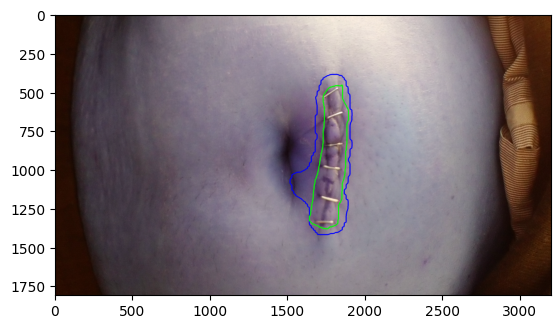

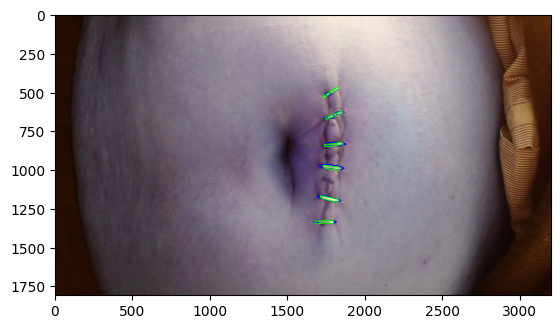

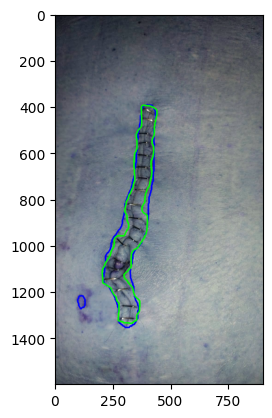

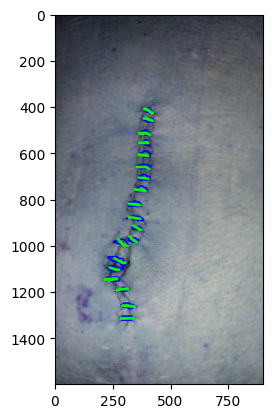

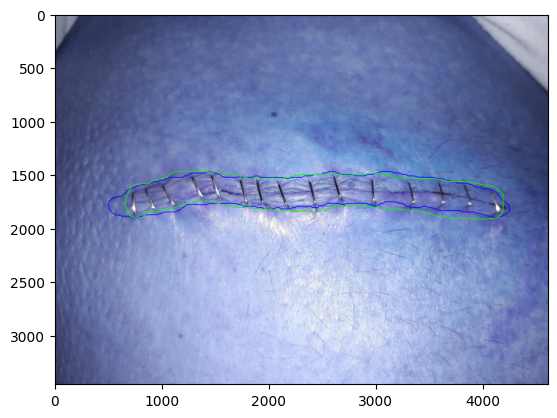

...

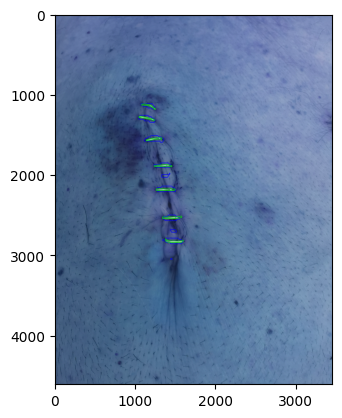

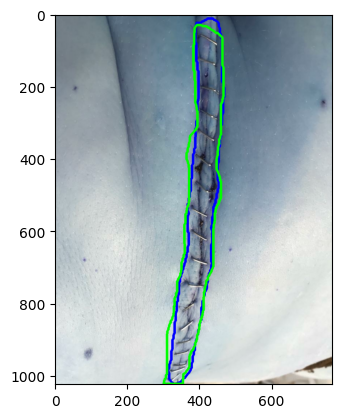

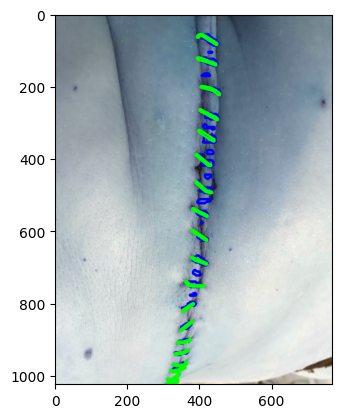

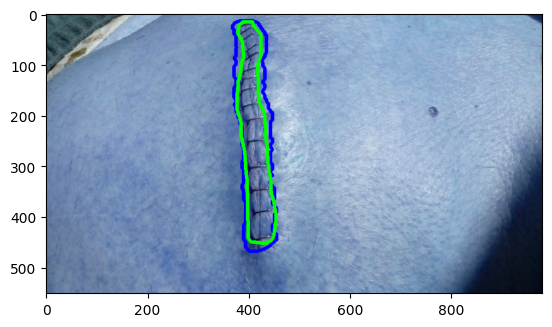

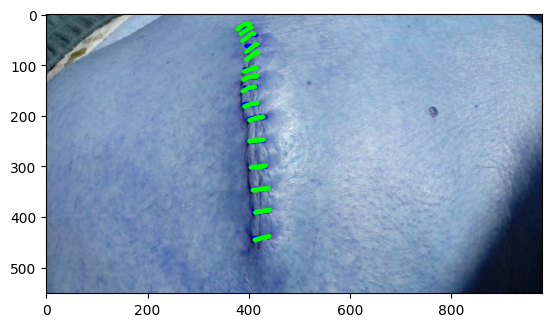

In [19]:
REDSCAR_DATASET = "/home/marc/UIB_EXPERIMENTS/REDSCAR"
REDSCAR_DATASET_TEST = os.path.join(REDSCAR_DATASET, "SUBSETS", "MACHINE_LEARNING_DATASET", "test")
ruta_imatge = os.path.join(REDSCAR_DATASET_TEST,'IMAGES')
ruta_gt_f = os.path.join(REDSCAR_DATASET_TEST,'GT_WOUND_MASK')
ruta_gt_g = os.path.join(REDSCAR_DATASET_TEST,'GT_STAPLES_MASK')
ruta_imatge = os.path.join(REDSCAR_DATASET_TEST,'IMAGES')
rutes_gt = [ruta_gt_f, ruta_gt_g]

ruta_millors = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment01/alta_resolucio_10_millors'
# guardam les millors
visualitzacions(model=loaded_model, noms_imatges=nom_millors, ruta_imatges=ruta_imatge, rutes_gt=rutes_gt, input_size=256, ruta_guardar = ruta_millors, titol="millor")


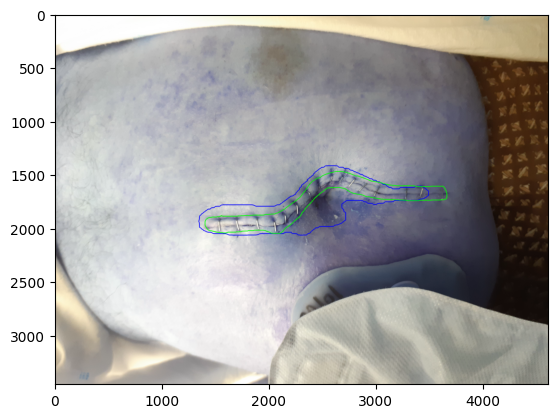

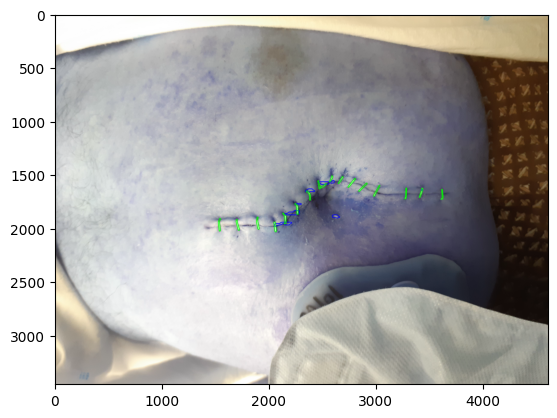

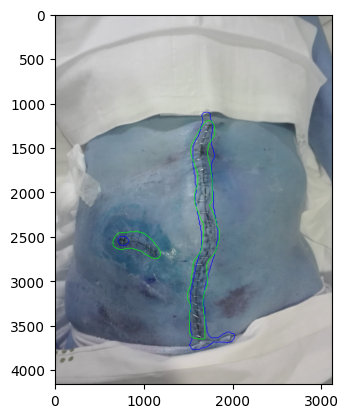

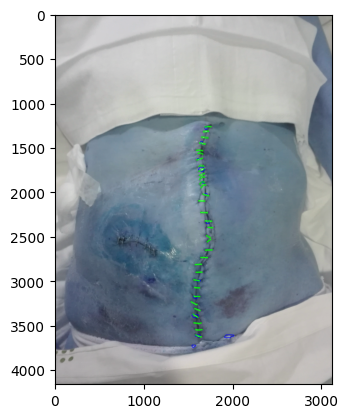

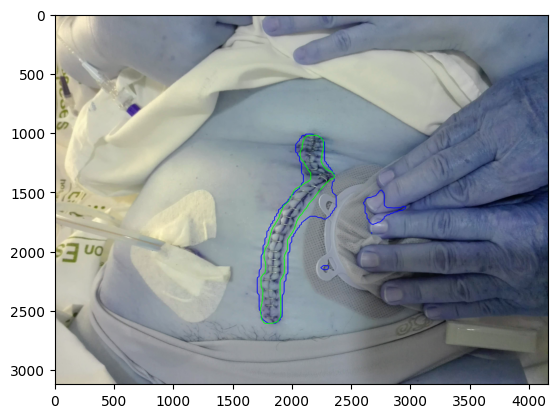

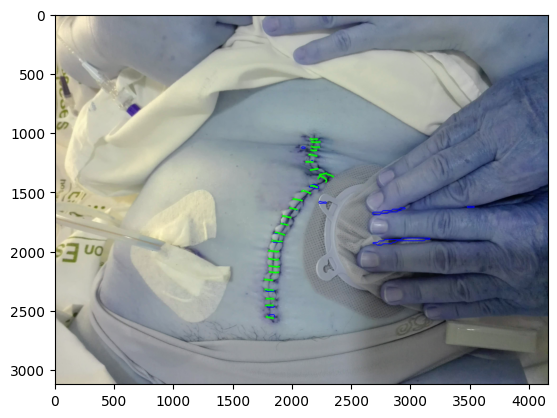

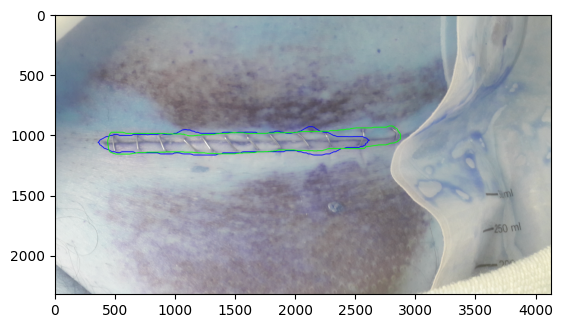

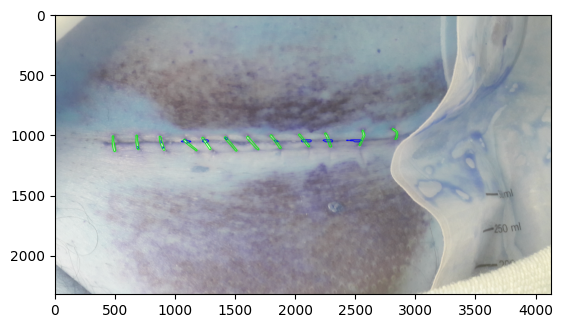

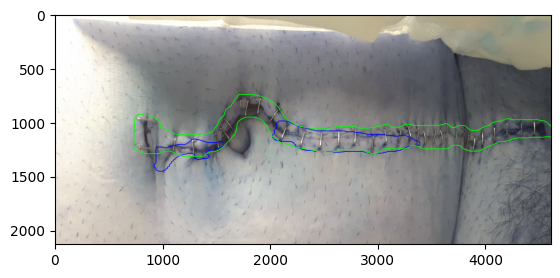

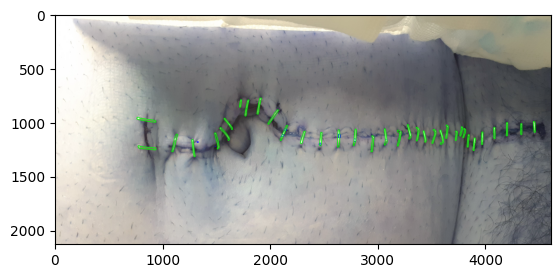

In [20]:
ruta_pitjors = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment01/alta_resolucio_5_pitjors'
# guardam les millors
visualitzacions(model=loaded_model, noms_imatges=nom_pitjors, ruta_imatges=ruta_imatge, rutes_gt=rutes_gt, input_size=256, ruta_guardar = ruta_millors, titol="pitjor")


## Filtratge 2: millors i pitjors imatges de baixa resolució

In [21]:
# filtram les imatges d'alta resolució -> df2:
df2 = df[df['NOM'].str.endswith('resolution=0.png')]

# eliminam les que NO tenen cap grapa
noms_sense = ['BSmmQo7gZrySCxbaqbqcUrv2F_infection=0_capture=1_resolution=0.png',
             'fEMdP896R7Ns2a6mtbb0uGbpT_infection=0_capture=1_resolution=0.png',
             'YH30nPmh3tokV3aNsPNrFNtpt_infection=0_capture=1_resolution=0.png',
             'fgXrcZ3JaNWgGsJWrjpt8kTi8_infection=0_capture=1_resolution=0.png',
             '2XKzbg86QY1lzFzF6xyk8r49M_infection=0_capture=1_resolution=0.png']
df2 = df2[~df2['NOM'].isin(noms_sense)].reset_index(drop=True)

# l'ordenam en funció del coeficient dice
df2_sorted = df2.sort_values(by='DICE_mean',ascending=False).reset_index(drop=True)# ordenem el df de major a menor coef. de dice
                                                       # per a accedir més fàcilment a les imatges que volem seleccionar

print(df2_sorted)

                                                  NOM    DICE_f  JACCARD_f  \
0   WwaDRJJxLPNttOx9plemyMDnn_infection=0_capture=...  0.881434   0.788004   
1   XIIlLL72NJGmdAye6jDJ5O9af_infection=0_capture=...  0.903008   0.823167   
2   SqzMLLMyU4icHeeVFWe5FAuGb_infection=0_capture=...  0.882400   0.789548   
3   xFxXLXh7O8elpSiHESB8UzHt7_infection=0_capture=...  0.903904   0.824658   
4   fsQjP7gdPYnqNWbJACkayeaK8_infection=0_capture=...  0.912722   0.839455   
5   Q8Gc67NrWWZCNTJ39HMHWPvoj_infection=0_capture=...  0.873786   0.775862   
6   VScErulur3Ws9LwjEl8EwyZWJ_infection=0_capture=...  0.896723   0.812782   
7   7PsK2pKVrkofRQKGB6yIyAmqv_infection=0_capture=...  0.892559   0.805966   
8   tSBNbbT8NVk7wj1KEn5UVHOtU_infection=0_capture=...  0.882807   0.790201   
9   89Cmrsk0up7FIc0NwQcL5vvwS_infection=0_capture=...  0.909076   0.833309   
10  TyBhzH33IhZk632VgBqkjmEWu_infection=0_capture=...  0.892236   0.805439   
11  ZNEwFzokPNJ60ObAHprkvCHuB_infection=0_capture=...  0.855236 

In [22]:
nom_tots = []
dice_tots = []

# seleccionam les 10 millors
nom_millors = []
for i in range(10):
    nom = df2_sorted.loc[i,"NOM"]
    nom_millors.append(nom)
    nom_tots.append(nom)
    dice_tots.append(df2_sorted.loc[i,"DICE_mean"])
    
# seleccionam les 5 pitjors
nom_pitjors = []
n = df2_sorted.shape[0]
# iteram a les 5 darreres files
for i in range(n-5,n):
    nom = df2_sorted.loc[i,"NOM"]
    dice_value = df2_sorted.loc[i,"DICE_mean"]
    nom_pitjors.append(nom)
    nom_tots.append(nom)
    dice_tots.append(dice_value)
#print(nom_millors)
print(nom_tots) 
print(dice_tots)
resultats_unet_baixa = pd.DataFrame({'NOM':nom_tots, 'DICE':dice_tots})
# el guardam com un arxiu .csv en la carpeta resultats
RESULTATS_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment01/unet_multitasca_resultats_baixa.csv'
resultats_unet_baixa.to_csv(RESULTATS_PATH, index=False)


['WwaDRJJxLPNttOx9plemyMDnn_infection=0_capture=1_resolution=0.png', 'XIIlLL72NJGmdAye6jDJ5O9af_infection=0_capture=1_resolution=0.png', 'SqzMLLMyU4icHeeVFWe5FAuGb_infection=0_capture=1_resolution=0.png', 'xFxXLXh7O8elpSiHESB8UzHt7_infection=0_capture=1_resolution=0.png', 'fsQjP7gdPYnqNWbJACkayeaK8_infection=0_capture=1_resolution=0.png', 'Q8Gc67NrWWZCNTJ39HMHWPvoj_infection=0_capture=1_resolution=0.png', 'VScErulur3Ws9LwjEl8EwyZWJ_infection=0_capture=1_resolution=0.png', '7PsK2pKVrkofRQKGB6yIyAmqv_infection=0_capture=1_resolution=0.png', 'tSBNbbT8NVk7wj1KEn5UVHOtU_infection=0_capture=1_resolution=0.png', '89Cmrsk0up7FIc0NwQcL5vvwS_infection=0_capture=1_resolution=0.png', 'eLAueFsX2uuS8St1LLQo0uAVI_infection=0_capture=1_resolution=0.png', 'hUr4L8D2AxOB7sBbzZsInBEHl_infection=0_capture=1_resolution=0.png', 'cPYhmZcbJwrTse9ivAwswH3aR_infection=0_capture=1_resolution=0.png', 'cTiK8ZgzLbF0IPJCdOmxdRieJ_infection=0_capture=1_resolution=0.png', 'Nnq9VMIujxGziNrbm89UxZ6SK_infection=0_capture=

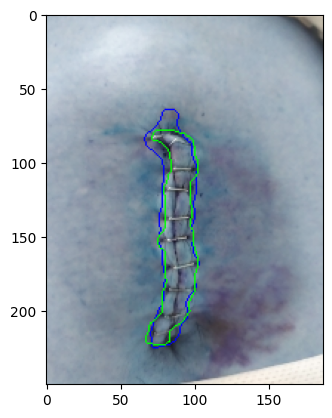

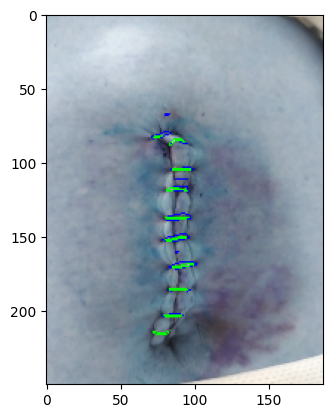

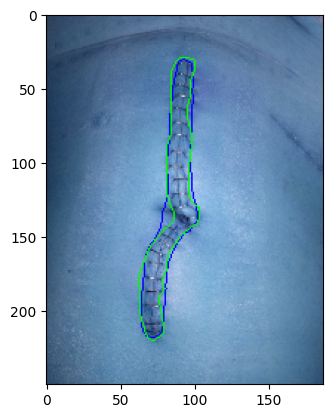

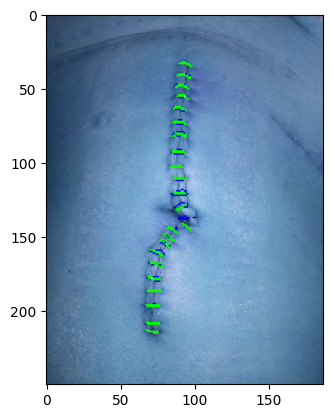

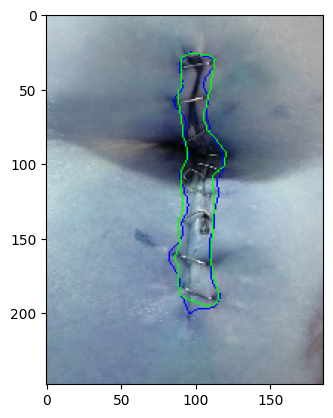

...

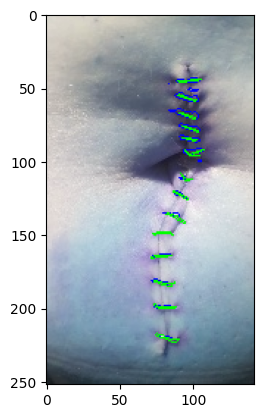

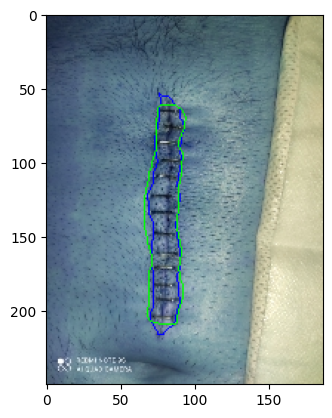

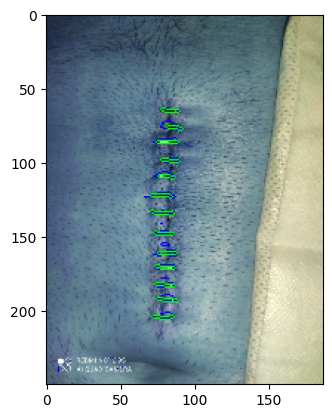

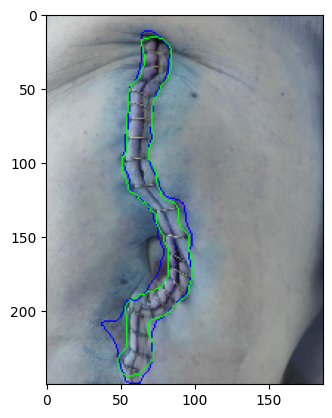

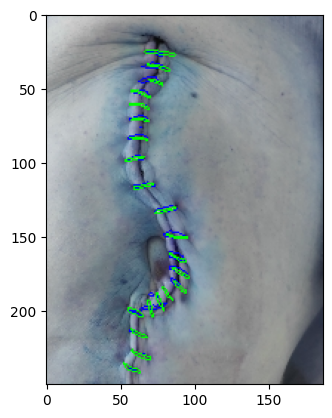

In [23]:
ruta_millors = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment01/baixa_resolucio_10_millors'
# guardam les millors
visualitzacions(model=loaded_model, noms_imatges=nom_millors, ruta_imatges=ruta_imatge, rutes_gt=rutes_gt, input_size=256, ruta_guardar = ruta_millors, titol="millor")


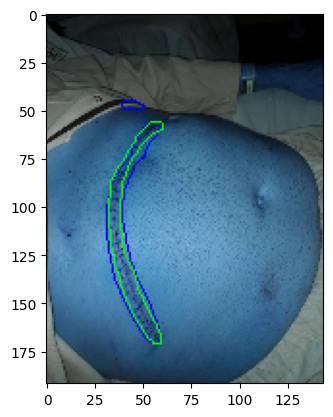

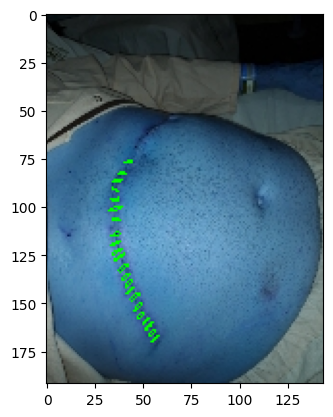

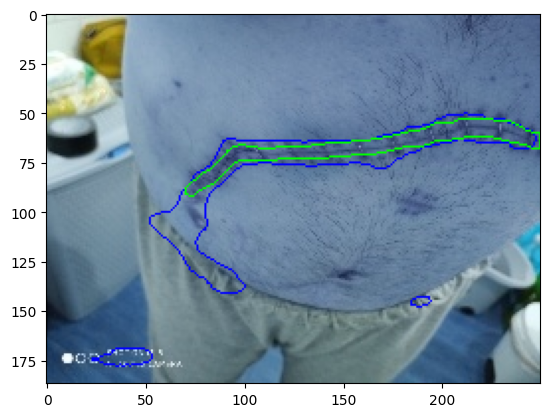

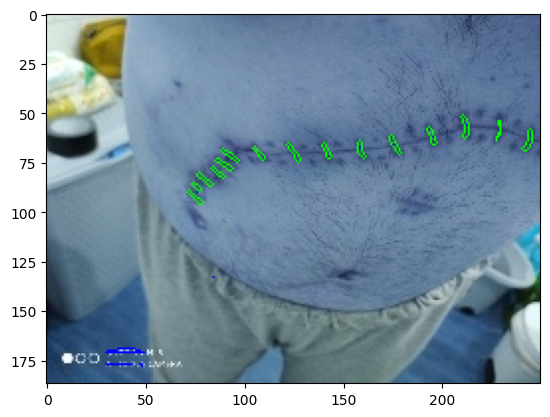

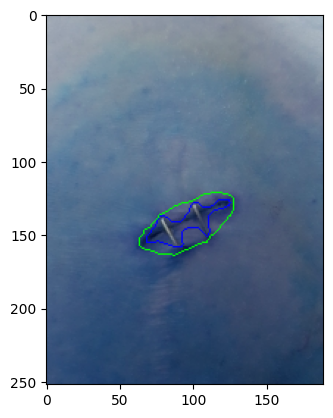

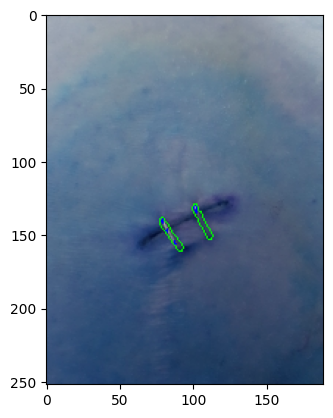

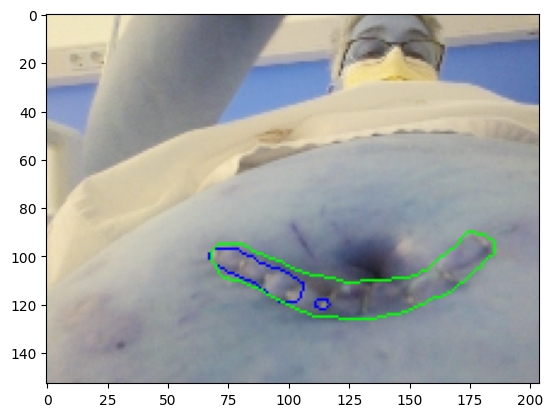

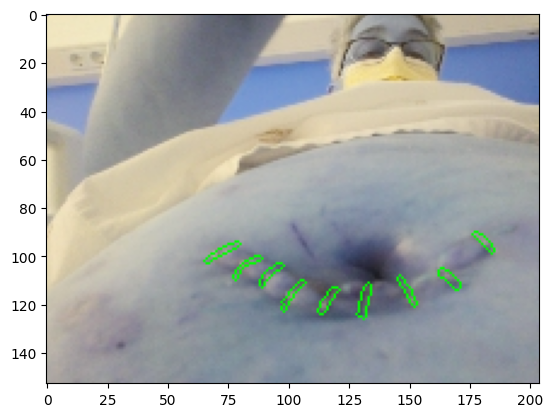

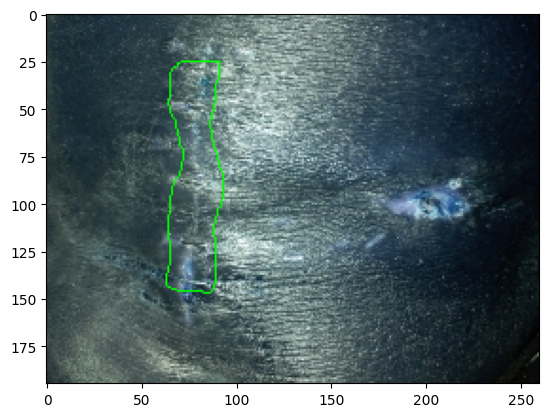

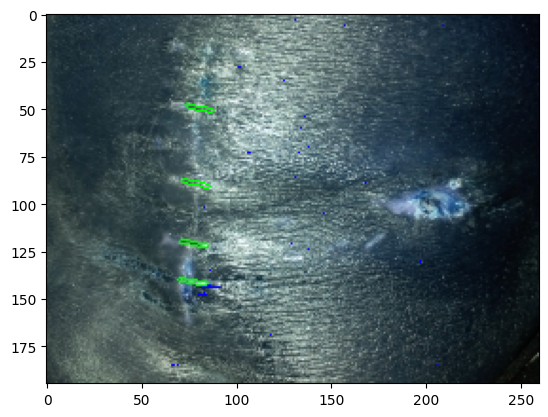

In [24]:
ruta_pitjors = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment01/baixa_resolucio_5_pitjors'
# guardam les millors
visualitzacions(model=loaded_model, noms_imatges=nom_pitjors, ruta_imatges=ruta_imatge, rutes_gt=rutes_gt, input_size=256, ruta_guardar = ruta_millors, titol="pitjor")
